# Microtrac particle size measurements
Calculations based on results from Microtrac for the NREL 2FBR fresh and used sand.


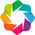

In [4]:
import numpy as np
import pandas as pd
import holoviews as hv
hv.extension('bokeh')
pd.set_option('display.max_columns', 100)

In [5]:
# dataframes for fresh sand (fsand) and used sand (usand)
fsand = pd.read_csv('../data/microtrac_fsand.csv', skiprows=[1])
usand = pd.read_csv('../data/microtrac_usand.csv', skiprows=[1])

# column names from the spreadsheet
usand.columns

Index(['Id', 'Img Id', 'Da', 'Dp', 'FWidth', 'FLength', 'FThickness',
       'ELength', 'EThickness', 'EWidth', 'Volume', 'Area', 'Perimeter',
       'CHull  Area', 'CHull Perimeter', 'Sphericity', 'L/T Ratio',
       'T/L Aspect Ratio', 'Compactness', 'Roundness', 'Ellipse Ratio',
       'Circularity', 'Solidity', 'Concavity', 'Convexity', 'Extent', 'hash',
       'Transparency', 'Curvature', 'Surface Area', 'Filter0', 'Filter1',
       'Filter2', 'Filter3', 'Filter4', 'Filter5', 'Filter6', 'L/W Ratio',
       'W/L Ratio', 'W/T Ratio', 'T/W Ratio', 'CHull Surface Area', 'Sieve',
       'Ellipticity', 'Fiber Length'],
      dtype='object')

In [6]:
fsand.describe()

,Id,Img Id,Da,Dp,FWidth,FLength,FThickness,ELength,EThickness,EWidth,Volume,Area,Perimeter,CHull Area,CHull Perimeter,Sphericity,L/T Ratio,T/L Aspect Ratio,Compactness,Roundness,Ellipse Ratio,Circularity,Solidity,Concavity,Convexity,Extent,hash,Transparency,Curvature,Surface Area,L/W Ratio,W/L Ratio,W/T Ratio,T/W Ratio,CHull Surface Area,Sieve,Ellipticity,Fiber Length
count,76382.000000,76382.000000,76382.000000,76382.000000,76382.000000,76382.000000,76382.000000,76382.000000,76382.000000,76382.000000,7.638200e+04,76382.000000,76382.000000,76382.000000,76382.000000,76382.000000,76382.000000,76382.000000,76382.000000,76382.000000,76382.000000,76382.000000,76382.000000,76382.000000,76382.000000,76382.000000,76382.0,76382.000000,76382.000000,7.638200e+04,76382.000000,76382.000000,76382.000000,76382.000000,7.638200e+04,76382.000000,76382.000000,76382.000000
mean,38191.500000,107305.108114,402.903348,426.031123,387.979274,517.529367,297.648246,518.441767,295.505339,387.483626,3.919463e+07,139634.100752,1338.416237,142011.216938,1329.638937,0.943025,1.776093,0.580653,0.779707,0.611621,0.577666,0.890026,0.982110,0.017890,0.993561,0.835039,0.0,0.479876,0.753409,5.585364e+05,1.364157,0.747713,1.311064,0.781084,5.680449e+05,342.813760,1.794904,76.111397
std,22049.728468,62457.112215,124.325194,129.240881,124.308608,159.874578,98.106814,163.318087,98.576005,125.254977,2.746426e+07,72276.962287,406.022218,73234.810799,403.409205,0.026984,0.328603,0.098531,0.060668,0.092888,0.106710,0.049356,0.010618,0.010618,0.004705,0.099420,0.0,0.053166,0.449155,2.891078e+05,0.215976,0.096444,0.213064,0.115735,2.929392e+05,108.487568,0.359348,172.744245
min,1.000000,5930.000000,24.308000,30.010000,21.330000,37.754000,21.330000,32.848000,16.846000,16.846000,1.010528e+04,464.063000,94.278000,482.261000,94.065000,0.626000,1.052000,0.195000,0.433000,0.187000,0.171000,0.392000,0.900000,0.000000,0.926000,0.512000,0.0,0.000000,0.000000,1.856251e+03,1.041000,0.195000,1.000000,0.332000,1.929045e+03,21.330000,1.000000,0.000000
25%,19096.250000,50972.500000,332.501500,352.913000,320.765500,425.911250,236.561750,423.670000,233.978250,319.401500,1.747751e+07,86831.480250,1108.709000,88528.327500,1101.015000,0.932000,1.543000,0.512000,0.742000,0.550000,0.503000,0.868250,0.977000,0.011000,0.992000,0.767000,0.0,0.456000,0.424000,3.473259e+05,1.221000,0.690000,1.162000,0.703000,3.541133e+05,281.808000,1.540000,0.000000
50%,38191.500000,104842.000000,416.055500,440.448500,399.827500,532.722000,303.422000,533.238500,301.170000,399.148000,3.417488e+07,135954.209000,1383.711000,138492.770500,1373.743000,0.948000,1.724000,0.580000,0.785000,0.616000,0.575000,0.899000,0.984000,0.016000,0.995000,0.818000,0.0,0.480000,0.734000,5.438168e+05,1.318000,0.759000,1.274000,0.785000,5.539711e+05,352.860500,1.738000,0.000000
75%,57286.750000,160879.000000,498.022750,523.953500,480.962250,631.424000,370.011750,633.177000,368.106500,481.254000,5.845004e+07,194799.822250,1646.047750,197887.670250,1635.906000,0.961000,1.953000,0.648000,0.823000,0.678000,0.649000,0.923000,0.989000,0.023000,0.996000,0.886000,0.0,0.506000,1.053000,7.791993e+05,1.450000,0.819000,1.422000,0.860000,7.915507e+05,425.380000,1.988000,0.000000
max,76382.000000,232771.000000,846.211000,898.535000,831.966000,1175.644000,664.388000,1192.671000,664.414000,847.868000,3.288452e+08,562403.083000,2822.832000,570302.248000,2801.710000,0.991000,5.134000,0.951000,0.965000,0.931000,1.000000,0.981000,1.000000,0.100000,1.000000,1.877000,0.0,0.776000,4.393000,2.249612e+06,5.134000,0.961000,3.010000,1.000000,2.281209e+06,739.075000,5.861000,1481.927000


In [7]:
usand.describe()

,Id,Img Id,Da,Dp,FWidth,FLength,FThickness,ELength,EThickness,EWidth,Volume,Area,Perimeter,CHull Area,CHull Perimeter,Sphericity,L/T Ratio,T/L Aspect Ratio,Compactness,Roundness,Ellipse Ratio,Circularity,Solidity,Concavity,Convexity,Extent,hash,Transparency,Curvature,Surface Area,L/W Ratio,W/L Ratio,W/T Ratio,T/W Ratio,CHull Surface Area,Sieve,Ellipticity,Fiber Length
count,50607.000000,50607.000000,50607.000000,50607.000000,50607.000000,50607.000000,50607.000000,50607.000000,50607.000000,50607.000000,5.060700e+04,5.060700e+04,50607.000000,5.060700e+04,50607.000000,50607.000000,50607.000000,50607.000000,50607.000000,50607.000000,50607.000000,50607.000000,50607.000000,50607.000000,50607.000000,50607.000000,50607.0,50607.000000,50607.000000,5.060700e+04,50607.000000,50607.000000,50607.000000,50607.000000,5.060700e+04,50607.000000,50607.000000,50607.000000
mean,25304.000000,118075.215642,343.592091,365.001786,326.075790,446.584162,258.387217,444.724983,257.231447,325.011156,2.634024e+07,1.045683e+05,1146.686927,1.064295e+05,1140.742089,0.932856,1.810137,0.581625,0.767226,0.596440,0.584180,0.873854,0.980339,0.019661,0.995194,0.807225,0.0,0.212276,0.011508,4.182730e+05,1.481699,0.717297,1.245443,0.821497,4.257181e+05,292.231504,1.818960,63.020360
std,14609.126873,79588.583875,122.821899,128.243192,125.878111,163.743494,96.317559,166.253464,96.746456,126.403699,2.118429e+07,5.904415e+04,402.887903,6.070373e+04,398.454684,0.060265,0.506717,0.115021,0.088346,0.125605,0.124158,0.102331,0.029319,0.029319,0.008419,0.102116,0.0,0.104847,0.138422,2.361766e+05,0.504636,0.138695,0.201445,0.118343,2.428149e+05,109.235920,0.570602,171.650737
min,1.000000,3572.000000,24.308000,30.010000,21.235000,37.754000,21.235000,32.848000,12.230000,12.230000,1.010528e+04,4.640630e+02,94.278000,4.822610e+02,94.065000,0.398000,1.068000,0.067000,0.261000,0.068000,0.072000,0.159000,0.700000,0.000000,0.871000,0.354000,0.0,0.000000,0.000000,1.856251e+03,1.033000,0.067000,1.000000,0.230000,1.929045e+03,21.235000,1.000000,0.000000
25%,12652.500000,43778.500000,312.151000,326.767000,294.608500,389.444500,224.832500,385.735000,224.341500,293.791000,1.451107e+07,7.652783e+04,1026.569500,7.742186e+04,1024.081000,0.928000,1.515000,0.515000,0.731000,0.534000,0.512000,0.861000,0.980000,0.006000,0.995000,0.748000,0.0,0.165000,0.000000,3.061113e+05,1.229000,0.659000,1.106000,0.741000,3.096874e+05,264.438000,1.500000,0.000000
50%,25304.000000,112992.000000,363.999000,382.278000,348.749000,460.405000,273.694000,458.053000,272.952000,348.336000,2.307658e+07,1.040614e+05,1200.963000,1.055781e+05,1196.728000,0.953000,1.693000,0.591000,0.785000,0.616000,0.591000,0.907000,0.989000,0.011000,0.998000,0.799000,0.0,0.180000,0.000000,4.162456e+05,1.337000,0.748000,1.215000,0.823000,4.223123e+05,311.888000,1.692000,0.000000
75%,37955.500000,187735.000000,416.816500,439.186500,402.243000,535.139500,318.671000,534.008000,317.566000,401.784500,3.495515e+07,1.364518e+05,1379.745500,1.387387e+05,1373.292500,0.966000,1.941000,0.660000,0.827000,0.684000,0.667000,0.933000,0.994000,0.020000,0.999000,0.860000,0.0,0.201000,0.000000,5.458074e+05,1.517000,0.814000,1.350000,0.904000,5.549549e+05,358.745500,1.952000,0.000000
max,50607.000000,282644.000000,1231.370000,1876.236000,1151.568000,2727.482000,881.198000,2792.364000,859.391000,1111.075000,8.186689e+08,1.190877e+06,5894.370000,1.394035e+06,5701.152000,0.994000,15.000000,0.936000,0.956000,0.913000,1.000000,0.988000,1.000000,0.300000,1.000000,2.615000,0.0,0.832000,5.496000,4.763508e+06,15.000000,0.968000,4.340000,1.000000,5.576139e+06,1016.383000,13.907000,2601.868000


## Roundness and Sphericity

In [8]:
%%opts Scatter(alpha=0.5)[height=380 width=380]
fround = hv.Scatter((fsand['Da'], fsand['Roundness']), kdims='Da [um]', vdims='Roundness [-]', label='fresh')
uround = hv.Scatter((usand['Da'], usand['Roundness']), kdims='Da [um]', vdims='Roundness [-]', label='used')
fround + uround

:Layout
   .Scatter.Fresh :Scatter   [Da [um]]   (Roundness [-])
   .Scatter.Used  :Scatter   [Da [um]]   (Roundness [-])

In [9]:
%%opts Scatter(alpha=0.5)[height=380 width=380]
fsphere = hv.Scatter((fsand['Da'], fsand['Sphericity']), kdims='Da [um]', vdims='Sphericity [-]', label='fresh')
usphere = hv.Scatter((usand['Da'], usand['Sphericity']), kdims='Da [um]', vdims='Sphericity [-]', label='used')
fsphere + usphere

:Layout
   .Scatter.Fresh :Scatter   [Da [um]]   (Sphericity [-])
   .Scatter.Used  :Scatter   [Da [um]]   (Sphericity [-])

## Da

In [10]:
%%opts Histogram [height=380 width=380 tools=['hover']]

fcount = fsand['Da'].count()
ucount = usand['Da'].count()
print(f'fresh particles {fcount}')
print(f'used particles {ucount}')

freq_f, edges_f = np.histogram(fsand['Da'], bins=40)
freq_u, edges_u = np.histogram(usand['Da'], bins=40)
fhist = hv.Histogram((freq_f/fcount*100, edges_f), kdims='Da [um]', vdims='Number [%]', label='fresh')
uhist = hv.Histogram((freq_u/ucount*100, edges_u), kdims='Da [um]', vdims='Number [%]', label='used')
fhist + uhist

fresh particles 76382
used particles 50607


:Layout
   .Histogram.Fresh :Histogram   [Da [um]]   (Number [%])
   .Histogram.Used  :Histogram   [Da [um]]   (Number [%])

## FLength

In [11]:
%%opts Curve [height=380 width=380]

nfresh = fsand['FLength'].count()
zfresh = fsand['FLength']
xfresh = np.sort(zfresh)
cfresh = np.array(range(nfresh)) / nfresh

nused = usand['FLength'].count()
zused = usand['FLength']
xused = np.sort(zused)
cused = np.array(range(nused)) / nused

cdf1 = hv.Curve((xfresh, cfresh), label='fresh', kdims='FLength [um]', vdims='CDF', extents=(0, 0, 3000, 1.1))
cdf2 = hv.Curve((xused, cused), label='used', kdims='FLength [um]', vdims='CDF', extents=(0, 0, 3000, 1.1))

cdf1 + cdf2

# renderer = hv.Store.renderers['bokeh'].instance(fig='png')
# renderer.save(cdf1 + cdf2, 'example')

:Layout
   .Curve.Fresh :Curve   [FLength [um]]   (CDF)
   .Curve.Used  :Curve   [FLength [um]]   (CDF)